In [1]:
# !pip install pytube
from pytube import YouTube
import os

def downloadYouTube(videourl, path):
    yt = YouTube(videourl)
    yt = yt.streams.filter(progressive=True, file_extension='mp4').order_by('resolution').desc().first()
    if not os.path.exists(path):
        os.makedirs(path)
    yt.download(path)

downloadYouTube('https://www.youtube.com/watch?v=yLN9tGbGlz8', 'dragon_ball')

In [2]:
# !pip install -U kora

from kora.drive import upload_public
url = upload_public('dragon_ball/1.mp4')

from IPython.display import HTML
HTML(f"""<video src={url} width=500 controls/>""")

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


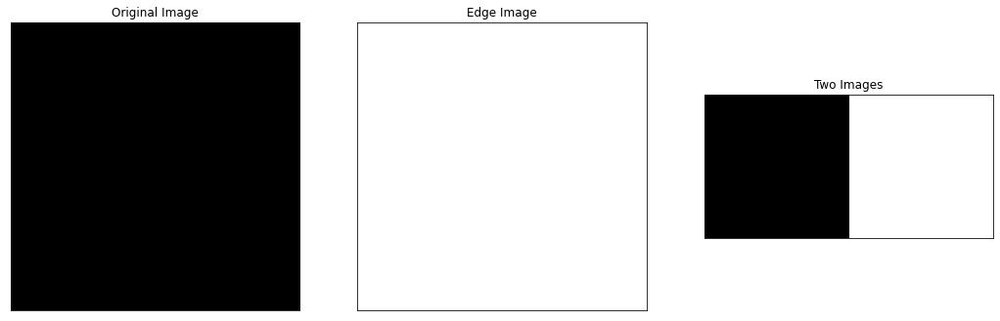

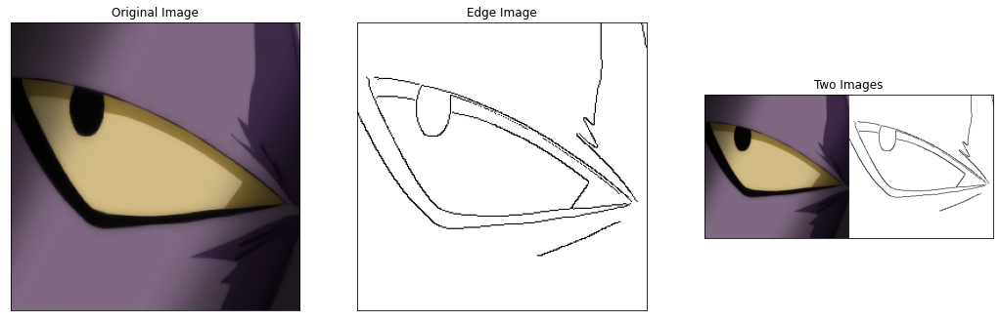

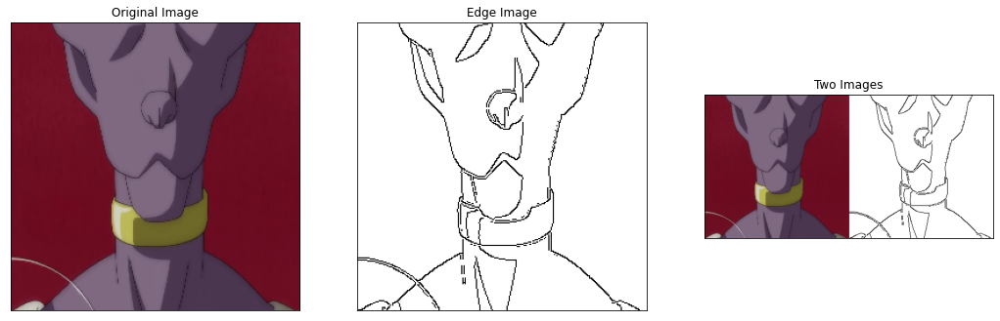

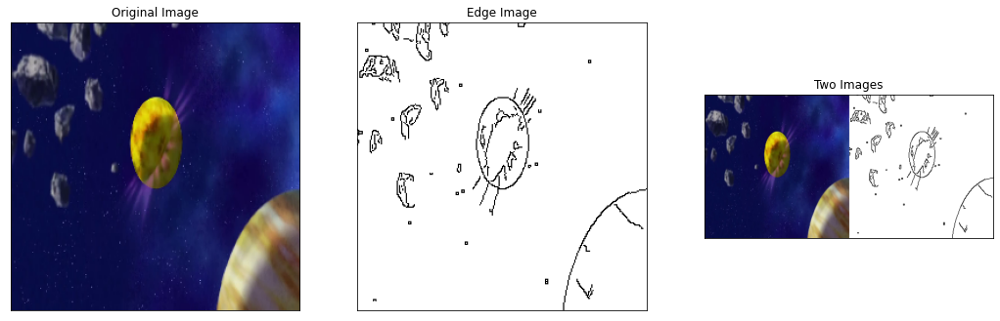

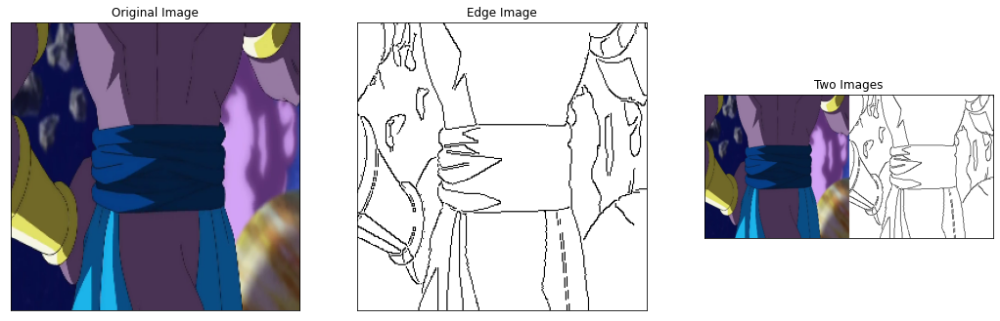

...

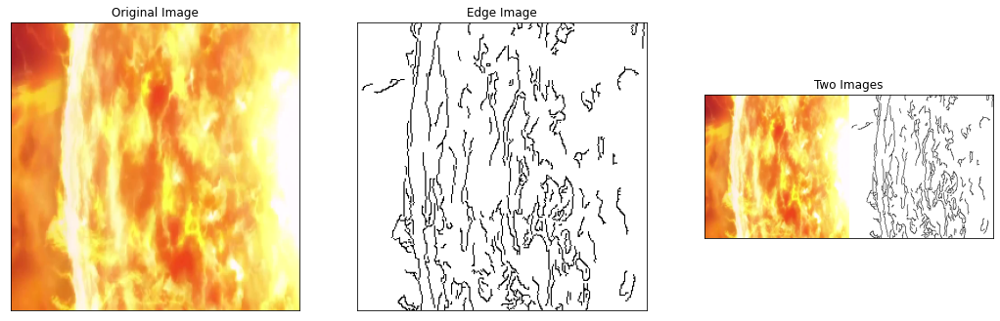

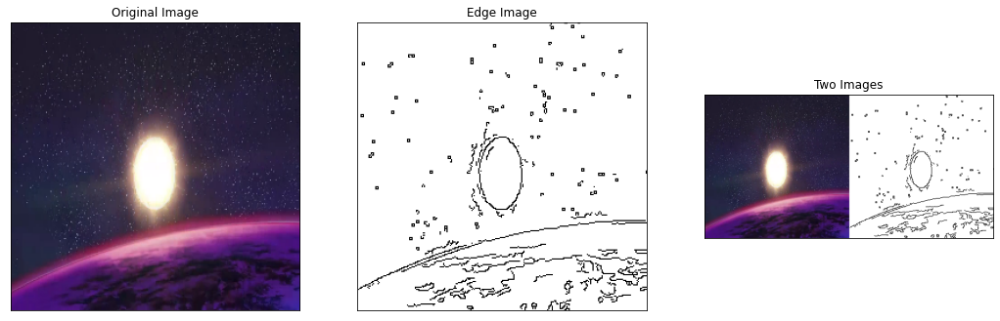

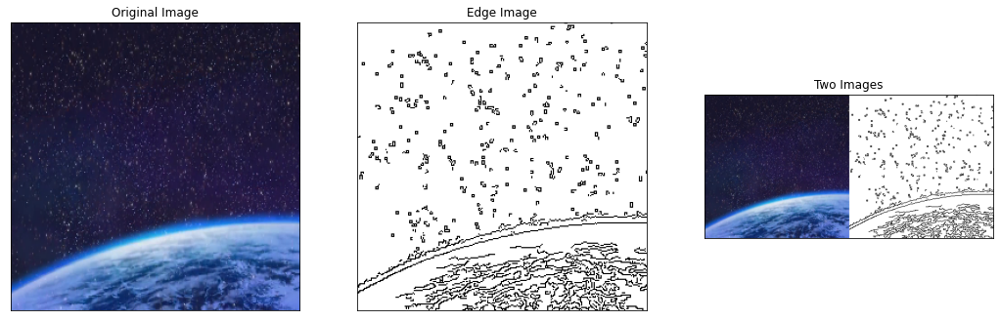

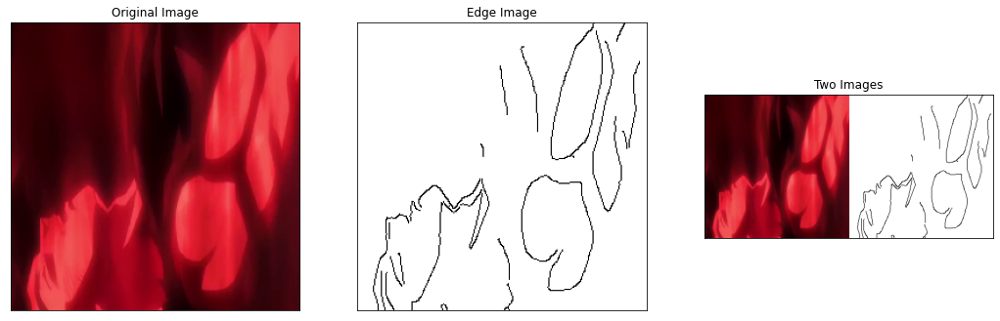

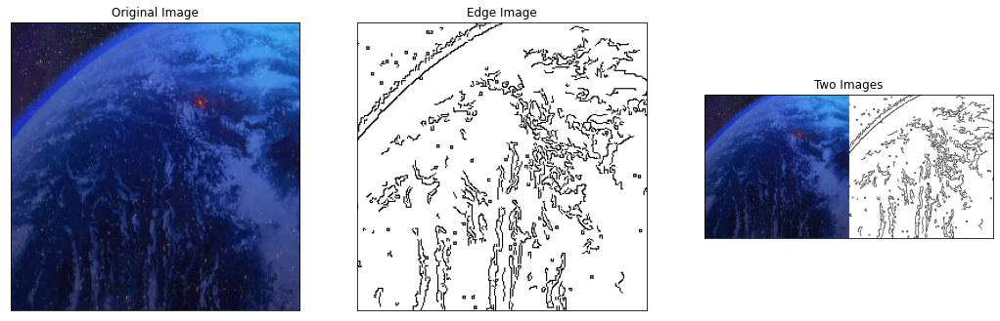

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import itertools
import cv2
import os

dest_frame = "/content/drive/MyDrive/dragon_ball/frames_edges/"
if not os.path.exists(dest_frame):
    os.makedirs(dest_frame)
 

cap= cv2.VideoCapture('./dragon_ball/1.mp4')
i=0
fn = itertools.count()
while(cap.isOpened()):
    ret, frame = cap.read()
    if ret == False:
        break

    if i % 100 == 0:
        frame = cv2.resize(frame, (256,256))
        edges = cv2.Canny(frame,100,200)
        edges = cv2.subtract(255, edges)
        edges = cv2.merge((edges,edges,edges))
        img_edges = np.concatenate((frame, edges), axis=1)
        cv2.imwrite(f'{dest_frame}/frame{str(next(fn))}.jpg', img_edges)

        plt.figure(figsize=(18,9))
        img = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
        plt.subplot(131),plt.imshow(img)
        plt.title('Original Image'), plt.xticks([]), plt.yticks([])

        plt.subplot(132),plt.imshow(edges)
        plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

        img_edges = cv2.cvtColor(img_edges, cv2.COLOR_RGB2BGR)
        plt.subplot(133),plt.imshow(img_edges)
        plt.title('Two Images'), plt.xticks([]), plt.yticks([])
        plt.show()
    i+=1
cap.release()
cv2.destroyAllWindows()